# $\;\;\;\;\;\;\;\;\;\;\;\;\;\;\;\;\;\;\;\;\;\;\;\;\;\;\;\;\;\;\;\;\;\;$ Food Vision Mini

## A model based on EfficientNet b0 model and trained and tested on data from [Food 101](https://data.vision.ee.ethz.ch/cvl/datasets_extra/food-101/static/bossard_eccv14_food-101.pdf)

###Goal is to beat the original food 101 model(50.76% accuracy) by using only 10% of the training data

## Download the data

In [3]:
# data we are downloading  comes from original food 101 dataset but it is already pre processed(randomly selected 10% data and separated in test and training folders)
!wget https://storage.googleapis.com/ztm_tf_course/food_vision/101_food_classes_10_percent.zip

--2022-01-18 21:21:00--  https://storage.googleapis.com/ztm_tf_course/food_vision/101_food_classes_10_percent.zip
Resolving storage.googleapis.com (storage.googleapis.com)... 172.217.27.208, 172.217.160.208, 172.217.166.48, ...
Connecting to storage.googleapis.com (storage.googleapis.com)|172.217.27.208|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 1625420029 (1.5G) [application/zip]
Saving to: '101_food_classes_10_percent.zip'

     0K .......... .......... .......... .......... ..........  0%  858K 30m51s
    50K .......... .......... .......... .......... ..........  0% 1.59M 23m32s
   100K .......... .......... .......... .......... ..........  0% 2.50M 19m8s
   150K .......... .......... .......... .......... ..........  0% 3.80M 16m3s
   200K .......... .......... .......... .......... ..........  0% 3.23M 14m26s
   250K .......... .......... .......... .......... ..........  0%  920K 16m49s
   300K .......... .......... .......... .......... .........

In [4]:
# unzip the data
import zipfile
zip_ref = zipfile.ZipFile("101_food_classes_10_percent.zip")
zip_ref.extractall()
zip_ref.close()

In [1]:
# set directories
train_dir = "101_food_classes_10_percent/train"
test_dir = "101_food_classes_10_percent/test"

In [2]:
# check the data
import os
for dir_path, dir_name, file_name in os.walk("101_food_classes_10_percent"):
    print(f"There are {len(dir_name)} Directories and {len(file_name)} Files in '{dir_path}'.")

There are 2 Directories and 0 Files in '101_food_classes_10_percent'.
There are 101 Directories and 0 Files in '101_food_classes_10_percent\test'.
There are 0 Directories and 250 Files in '101_food_classes_10_percent\test\apple_pie'.
There are 0 Directories and 250 Files in '101_food_classes_10_percent\test\baby_back_ribs'.
There are 0 Directories and 250 Files in '101_food_classes_10_percent\test\baklava'.
There are 0 Directories and 250 Files in '101_food_classes_10_percent\test\beef_carpaccio'.
There are 0 Directories and 250 Files in '101_food_classes_10_percent\test\beef_tartare'.
There are 0 Directories and 250 Files in '101_food_classes_10_percent\test\beet_salad'.
There are 0 Directories and 250 Files in '101_food_classes_10_percent\test\beignets'.
There are 0 Directories and 250 Files in '101_food_classes_10_percent\test\bibimbap'.
There are 0 Directories and 250 Files in '101_food_classes_10_percent\test\bread_pudding'.
There are 0 Directories and 250 Files in '101_food_class

# Setup the data

In [3]:
import tensorflow as tf

# create testing and trainiing data
IMG_SIZE = (224,224)

train_data = tf.keras.preprocessing.image_dataset_from_directory(train_dir,
                                                                 image_size = IMG_SIZE,
                                                                 label_mode = "categorical")

test_data = tf.keras.preprocessing.image_dataset_from_directory(test_dir,
                                                                 image_size = IMG_SIZE,
                                                                 label_mode = "categorical", 
                                                                 shuffle = False)

Found 7575 files belonging to 101 classes.
Found 25250 files belonging to 101 classes.


## create callback

In [5]:
# model checkpoint callback
checkpoint_path = "checkpoint callback/101_10%_checkpoint"
checkpoint_callback = tf.keras.callbacks.ModelCheckpoint(checkpoint_path, 
                                                        save_weights_only=True,
                                                        monitor = "accuracy",
                                                        save_best_only = True)

In [6]:
# tensorboard callback
import datetime

def create_tensorboard_callback(dir_name, exp_name):
    """
    this function creates a tensorboard callback
    
    dir_name :- the directory name whetre callback files are to be saved.
    exp_name :- model name / experiment name
    """
    log_dir = dir_name + "/" + exp_name + "/" +  datetime.datetime.now().strftime("%Y%m%d-%H%M%S")
    tensorboard_callback = tf.keras.callbacks.TensorBoard(log_dir = log_dir)
    print(f"Saving Tenserboard lof files to : {log_dir}")
    return tensorboard_callback

### create data augmentation layer

In [14]:
from tensorflow.keras import layers
from tensorflow.keras.layers.experimental import preprocessing
from tensorflow.keras import Sequential

data_aug = Sequential([
    preprocessing.RandomFlip("horizontal"),
    preprocessing.RandomRotation(0.2),
    preprocessing.RandomHeight(0.2),
    preprocessing.RandomZoom(0.2),
    preprocessing.RandomWidth(0.2)
], name = "data_augmentation")

# Build model

In [66]:
# setup the base model and freeze the layers
base_model = tf.keras.applications.EfficientNetB0(include_top = False)
base_model.trainable = False

# setup input layer
inputs = layers.Input(shape = (224,224,3), name = "input_layer")
x = data_aug(inputs)
x = base_model(x, training = False)
x = layers.GlobalAveragePooling2D(name = "aug_layer")(x)
output = layers.Dense(len(train_data.class_names), activation = "softmax", name = "output")(x)
model_1 = tf.keras.Model(inputs, output)

In [67]:
model_1.summary()

Model: "model_3"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_layer (InputLayer)    [(None, 224, 224, 3)]     0         
                                                                 
 data_augmentation (Sequenti  (None, None, None, 3)    0         
 al)                                                             
                                                                 
 efficientnetb0 (Functional)  (None, None, None, 1280)  4049571  
                                                                 
 aug_layer (GlobalAveragePoo  (None, 1280)             0         
 ling2D)                                                         
                                                                 
 output (Dense)              (None, 101)               129381    
                                                                 
Total params: 4,178,952
Trainable params: 129,381
Non-train

### compile the model

In [68]:
model_1.compile(loss = tf.keras.losses.categorical_crossentropy,
               optimizer = tf.keras.optimizers.Adam(),
               metrics = ["accuracy"])

### fit the model

In [69]:
history_1 = model_1.fit(train_data, 
                       epochs = 5, 
                       steps_per_epoch = len(train_data),
                       validation_data = test_data,
                       validation_steps = int(0.15 * len(test_data)),
                       callbacks=[checkpoint_callback, create_tensorboard_callback(dir_name = "tb_callback",
                                                                                  exp_name = "101_10%_M1E1")])

Saving Tenserboard lof files to : tb_callback/101_10%_M1E1/20220119-143212
Epoch 1/5
237/237 [==============================] - 50s 175ms/step - loss: 3.4779 - accuracy: 0.2455 - val_loss: 2.6664 - val_accuracy: 0.4073
Epoch 2/5
237/237 [==============================] - 41s 172ms/step - loss: 2.3699 - accuracy: 0.4610 - val_loss: 2.2400 - val_accuracy: 0.4637
Epoch 3/5
237/237 [==============================] - 41s 171ms/step - loss: 1.9835 - accuracy: 0.5245 - val_loss: 2.0804 - val_accuracy: 0.4841
Epoch 4/5
237/237 [==============================] - 40s 169ms/step - loss: 1.7667 - accuracy: 0.5762 - val_loss: 1.9968 - val_accuracy: 0.4886
Epoch 5/5
237/237 [==============================] - 40s 168ms/step - loss: 1.6081 - accuracy: 0.6042 - val_loss: 1.8996 - val_accuracy: 0.5077


In [70]:
# evaluate the model on full test dataset
model_1B_result = model_1.evaluate(test_data)

790/790 [==============================] - 83s 104ms/step - loss: 1.7168 - accuracy: 0.5523


#### plot the loss crves

In [25]:
import matplotlib.pyplot as plt
# loss curve function
def plot_loss_accuracy_curve (history):
    """
    plots separate loss curves for training and test data sets
    """
    loss = history.history["loss"]
    accuracy = history.history["accuracy"]
    
    val_loss = history.history["val_loss"]
    val_accuracy = history.history["val_accuracy"]
    
    epochs = range(len(history.history["loss"]))
    
    # plot the teaining curves
    plt.plot(epochs, accuracy, label = "Training_accuracy")
    plt.plot(epochs, val_accuracy, label = "Validation_accuracy")
    plt.title("Accuracy")
    plt.xlabel("epochs")
    plt.legend()
    
    # plot the validation curves
    plt.figure()
    plt.plot(epochs, loss, label = "Training_loss")
    plt.plot(epochs, val_loss, label = "Valalidation_loss")    
    plt.title("Loss")
    plt.xlabel("epochs")
    plt.legend()

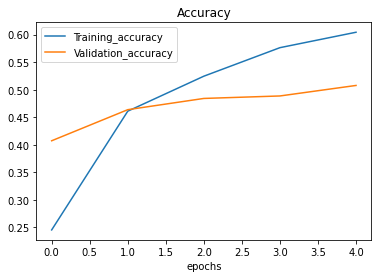

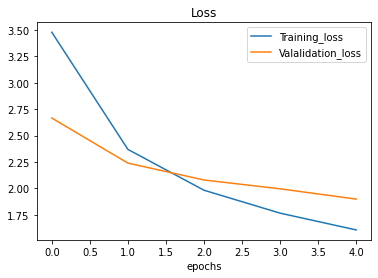

In [71]:
plot_loss_accuracy_curve(history_1)

# Fine Tuining

In [72]:
# unfreeze all layers of base model
base_model.trainable = True

# refreeze all layers except last 5 layers
for layer in base_model.layers[:-5]:
    layer.trainable = False

### Recompile and fit the model

In [73]:
model_1.compile(loss = tf.keras.losses.categorical_crossentropy,
               optimizer = tf.keras.optimizers.Adam(learning_rate = 0.0001),
               metrics = ["accuracy"])

In [74]:
history_2 = model_1.fit(train_data, 
                       epochs = 10, 
                       steps_per_epoch = len(train_data),
                       initial_epoch=history_1.epoch[-1],
                       validation_data = test_data,
                       validation_steps = int(0.15 * len(test_data)),
                       callbacks=[checkpoint_callback, create_tensorboard_callback(dir_name = "tb_callback",
                                                                                  exp_name = "101_10%_M1E2")])

Saving Tenserboard lof files to : tb_callback/101_10%_M1E2/20220119-143806
Epoch 5/10
237/237 [==============================] - 46s 161ms/step - loss: 1.3493 - accuracy: 0.6484 - val_loss: 1.8947 - val_accuracy: 0.5058
Epoch 6/10
237/237 [==============================] - 37s 158ms/step - loss: 1.2382 - accuracy: 0.6717 - val_loss: 1.9065 - val_accuracy: 0.5064
Epoch 7/10
237/237 [==============================] - 37s 156ms/step - loss: 1.1495 - accuracy: 0.6976 - val_loss: 1.9090 - val_accuracy: 0.5056
Epoch 8/10
237/237 [==============================] - 40s 170ms/step - loss: 1.0889 - accuracy: 0.7090 - val_loss: 1.8781 - val_accuracy: 0.5127
Epoch 9/10
237/237 [==============================] - 41s 171ms/step - loss: 1.0328 - accuracy: 0.7259 - val_loss: 1.8862 - val_accuracy: 0.5117
Epoch 10/10
237/237 [==============================] - 41s 172ms/step - loss: 0.9626 - accuracy: 0.7439 - val_loss: 1.8977 - val_accuracy: 0.5122


In [75]:
model_1FT1_result = model_1.evaluate(test_data)

790/790 [==============================] - 82s 103ms/step - loss: 1.6064 - accuracy: 0.5766


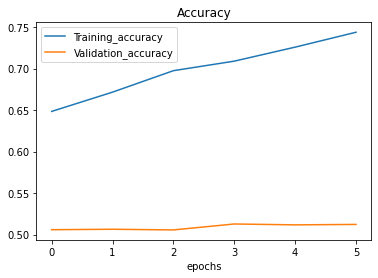

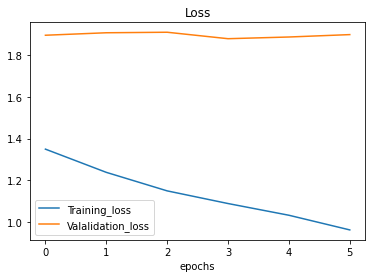

In [76]:
plot_loss_accuracy_curve(history_2)

# Fine tuining exp 2

In [77]:
# unfreeze all layers of base model
base_model.trainable = True

# refreeze all layers except last 20 layers
for layer in base_model.layers[:-5]:
    layer.trainable = False

### Recompile and fit the model

In [78]:
model_1.compile(loss = tf.keras.losses.categorical_crossentropy,
               optimizer = tf.keras.optimizers.Adam(learning_rate = 0.00001),
               metrics = ["accuracy"])

In [79]:
history_3 = model_1.fit(train_data, 
                       epochs = 16, 
                       steps_per_epoch = len(train_data),
                       initial_epoch=history_2.epoch[-1],
                       validation_data = test_data,
                       validation_steps = int(0.15 * len(test_data)),
                       callbacks=[checkpoint_callback, create_tensorboard_callback(dir_name = "tb_callback",
                                                                                  exp_name = "101_10%_M1E3")])

Saving Tenserboard lof files to : tb_callback/101_10%_M1E3/20220119-144427
Epoch 10/16
237/237 [==============================] - 49s 177ms/step - loss: 0.8771 - accuracy: 0.7700 - val_loss: 1.8809 - val_accuracy: 0.5188
Epoch 11/16
237/237 [==============================] - 42s 177ms/step - loss: 0.8711 - accuracy: 0.7721 - val_loss: 1.8862 - val_accuracy: 0.5177
Epoch 12/16
237/237 [==============================] - 42s 175ms/step - loss: 0.8559 - accuracy: 0.7752 - val_loss: 1.8867 - val_accuracy: 0.5185
Epoch 13/16
237/237 [==============================] - 40s 168ms/step - loss: 0.8463 - accuracy: 0.7836 - val_loss: 1.8758 - val_accuracy: 0.5230
Epoch 14/16
237/237 [==============================] - 39s 164ms/step - loss: 0.8437 - accuracy: 0.7774 - val_loss: 1.8812 - val_accuracy: 0.5207
Epoch 15/16
237/237 [==============================] - 41s 174ms/step - loss: 0.8367 - accuracy: 0.7838 - val_loss: 1.8845 - val_accuracy: 0.5199
Epoch 16/16
237/237 [============================

In [80]:
model_1.evaluate(test_data)

790/790 [==============================] - 78s 98ms/step - loss: 1.6064 - accuracy: 0.5798


[1.606429934501648, 0.5798019766807556]

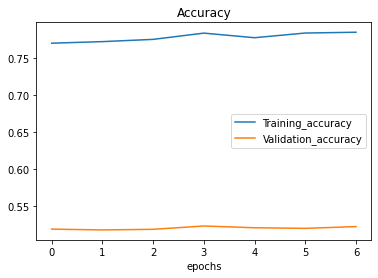

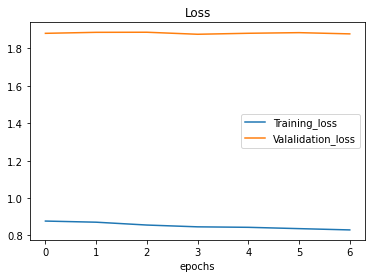

In [81]:
plot_loss_accuracy_curve(history_3)

# make predictions on our trained model

In [82]:
pred_probs = model_1.predict(test_data, verbose = 1)

790/790 [==============================] - 81s 102ms/step


In [83]:
len(pred_probs)

25250

In [86]:
test_data.class_names[tf.argmax(pred_probs[0])]

'apple_pie'

In [88]:
#get predicted classes from prediction probabilities
pred_classes = pred_probs.argmax(axis = 1)

In [105]:
# get test labels(true labels) and images
test_labels = []
test_images = []
for images, labels in test_data.unbatch():
    test_labels.append(labels.numpy().argmax())
    test_images.append(images.numpy())

# check the accurecy score

In [134]:
from sklearn.metrics import accuracy_score

In [135]:
Accuracy_score = accuracy_score(y_true = test_labels, y_pred = pred_classes)

In [136]:
Accuracy_score

0.5798019801980198

# create confusion matrics

In [141]:
import numpy as np

In [152]:
# make the confusion matrix function
import itertools
from sklearn.metrics import confusion_matrix

def make_confusion_matrix(y_true, y_pred, classes=None, figsize=(10, 10), text_size=15, save_fig = False):
    """
    This function creates congusion Matrix
    """
  # Create the confusion matrix
    cm = confusion_matrix(y_true, y_pred)
    cm_norm = cm.astype("float") / cm.sum(axis=1)[:, np.newaxis] # normalize our confusion matrix
    n_classes = cm.shape[0]

  # Let's prettify it
    fig, ax = plt.subplots(figsize=figsize)
  # Create a matrix plot
    cax = ax.matshow(cm, cmap=plt.cm.Blues)
    fig.colorbar(cax)

  # Set labels to be classes 
    if classes:
        labels = classes
    else:
        labels = np.arange(cm.shape[0])

  # Label the axes
    ax.set(title="Confusion Matrix",
        xlabel="Predicted Label",
        ylabel="True Label",
        xticks=np.arange(n_classes),
        yticks=np.arange(n_classes),
        xticklabels=labels, 
        yticklabels=labels)

  # Set x-axis labels to bottom
    ax.xaxis.set_label_position("bottom")
    ax.xaxis.tick_bottom()
    plt.xticks(rotation = 70)
    

  # Adjust label size
    ax.yaxis.label.set_size(text_size)
    ax.xaxis.label.set_size(text_size)
    ax.title.set_size(text_size)
    

  # Set threshold for different colors
    threshold = (cm.max() + cm.min()) / 2.

  # Plot the text on each cell
    for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
        plt.text(j, i, f"{cm[i, j]} ({cm_norm[i, j]*100:.1f}%)",
            horizontalalignment="center",
            color="white" if cm[i, j] > threshold else "black",
            size=text_size)
        
    # save the figure
    if save_fig:
        fig.savefig("Confusion_matrix_101.png")

In [153]:
make_confusion_matrix(y_true  = test_labels, 
                      y_pred = pred_classes, 
                      classes=test_data.class_names, 
                      figsize=(150, 150), 
                      text_size=20,
                      save_fig = True)

# classification Report

In [154]:
from sklearn.metrics import classification_report

In [156]:
print(classification_report(y_true = test_labels, y_pred = pred_classes))

              precision    recall  f1-score   support

           0       0.33      0.16      0.22       250
           1       0.47      0.72      0.57       250
           2       0.72      0.53      0.61       250
           3       0.83      0.48      0.61       250
           4       0.57      0.42      0.48       250
           5       0.49      0.35      0.41       250
           6       0.72      0.76      0.74       250
           7       0.83      0.69      0.75       250
           8       0.21      0.56      0.30       250
           9       0.40      0.61      0.48       250
          10       0.48      0.43      0.46       250
          11       0.77      0.54      0.63       250
          12       0.69      0.54      0.60       250
          13       0.49      0.54      0.52       250
          14       0.55      0.52      0.53       250
          15       0.44      0.28      0.34       250
          16       0.67      0.47      0.56       250
          17       0.34    

In [159]:
# get classification reprt dictnary
classification_dict = classification_report(y_true = test_labels, y_pred = pred_classes, output_dict = True)
classification_dict

{'0': {'precision': 0.33064516129032256,
  'recall': 0.164,
  'f1-score': 0.21925133689839574,
  'support': 250},
 '1': {'precision': 0.4738219895287958,
  'recall': 0.724,
  'f1-score': 0.5727848101265822,
  'support': 250},
 '2': {'precision': 0.7150537634408602,
  'recall': 0.532,
  'f1-score': 0.6100917431192661,
  'support': 250},
 '3': {'precision': 0.8333333333333334,
  'recall': 0.48,
  'f1-score': 0.6091370558375634,
  'support': 250},
 '4': {'precision': 0.5675675675675675,
  'recall': 0.42,
  'f1-score': 0.4827586206896552,
  'support': 250},
 '5': {'precision': 0.4888888888888889,
  'recall': 0.352,
  'f1-score': 0.40930232558139534,
  'support': 250},
 '6': {'precision': 0.7213740458015268,
  'recall': 0.756,
  'f1-score': 0.7382812500000001,
  'support': 250},
 '7': {'precision': 0.8309178743961353,
  'recall': 0.688,
  'f1-score': 0.7527352297592999,
  'support': 250},
 '8': {'precision': 0.20644216691068815,
  'recall': 0.564,
  'f1-score': 0.3022508038585209,
  'suppor

# plot F1 score with classes

In [161]:
class_f1_score = {}
for k, v in classification_dict.items():
    if k == "accuracy":
        break
    else:
        class_f1_score[test_data.class_names[int(k)]] = v["f1-score"]

class_f1_score

{'apple_pie': 0.21925133689839574,
 'baby_back_ribs': 0.5727848101265822,
 'baklava': 0.6100917431192661,
 'beef_carpaccio': 0.6091370558375634,
 'beef_tartare': 0.4827586206896552,
 'beet_salad': 0.40930232558139534,
 'beignets': 0.7382812500000001,
 'bibimbap': 0.7527352297592999,
 'bread_pudding': 0.3022508038585209,
 'breakfast_burrito': 0.48253968253968255,
 'bruschetta': 0.45665961945031713,
 'caesar_salad': 0.6338028169014085,
 'cannoli': 0.6040268456375839,
 'caprese_salad': 0.5180952380952382,
 'carrot_cake': 0.5308641975308641,
 'ceviche': 0.34146341463414637,
 'cheese_plate': 0.5552941176470587,
 'cheesecake': 0.4058441558441558,
 'chicken_curry': 0.47133757961783446,
 'chicken_quesadilla': 0.5991379310344828,
 'chicken_wings': 0.6961538461538462,
 'chocolate_cake': 0.5191146881287726,
 'chocolate_mousse': 0.3508064516129032,
 'churros': 0.7142857142857143,
 'clam_chowder': 0.6593406593406594,
 'club_sandwich': 0.683651804670913,
 'crab_cakes': 0.3476482617586912,
 'creme_br

In [173]:
# turn fi score into dataframe for visulisation
import pandas as pd
f1_score = pd.DataFrame({"classes": list(class_f1_score.keys()),
                       "f1_score": list(class_f1_score.values())}).sort_values("f1_score", ascending = True)

In [174]:
f1_score

,classes,f1_score
0,apple_pie,0.219251
93,steak,0.272321
39,foie_gras,0.278820
8,bread_pudding,0.302251
77,pork_chop,0.318182
...,...,...
91,spaghetti_carbonara,0.821497
45,frozen_yogurt,0.827160
75,pho,0.833962
63,macarons,0.873362


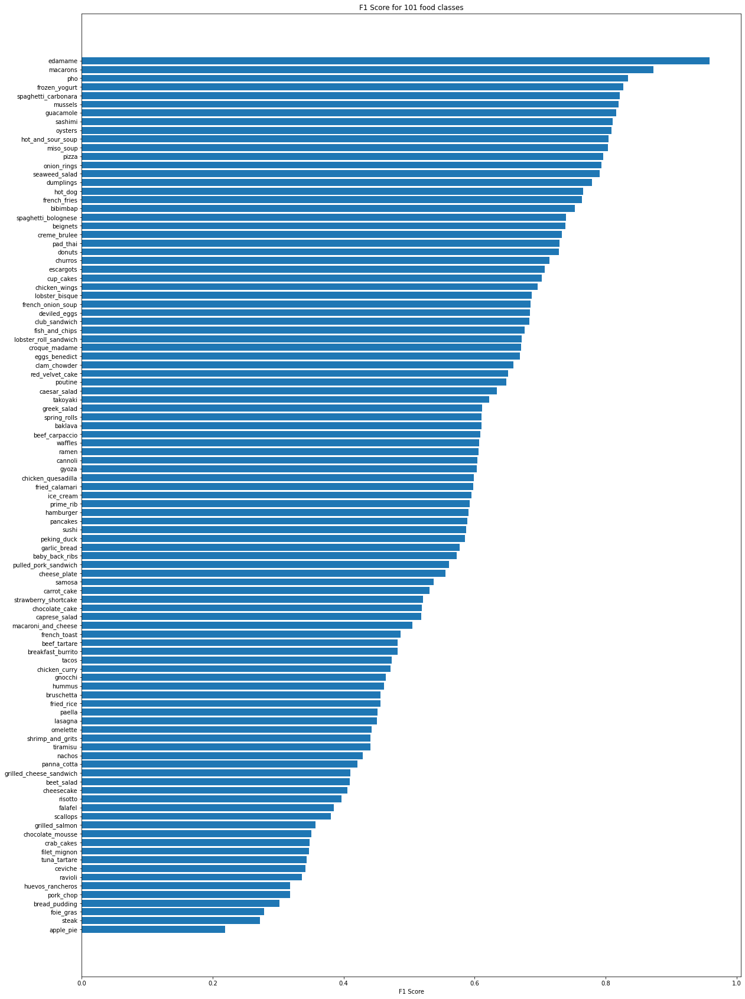

In [183]:
fig, ax = plt.subplots(figsize = (20,30))
scores = ax.barh(range(len(f1_score)),f1_score["f1_score"].values)
ax.set_yticks(range(len(f1_score)))
ax.set_yticklabels(f1_score["classes"])
ax.set_xlabel("F1 Score")
ax.set_title("F1 Score for 101 food classes");

# predictions on custom images

In [185]:
# load and pre process images
def load_and_prep_image(image, img_size = 224, scale = True):
    """
    read an image from filw_name and turn it into tensor and 
    reshape it to thr size (img_size, img_size, color channel)
    """
    
    # rwad the image
    img = tf.io.read_file(image)
    
    # decode the image
    img = tf.image.decode_image(img)
    
    # resize the image
    img = tf.image.resize(img, size = (img_size, img_size))
    
    # scale
    if scale:
        return img/255.
    else:
        return img

# make predictions on random image and compare the prediction with true label

In [186]:
# create function to test random images

import random

def plot_random_image(model, images, true_labels, classes):
    """
    Picks a random image plot it and label it with predicted and true lables.
    
    can be used for for evaluation of image classification model
    """
    
    # set a random integer
    i = random.randint(0, len(images))
    
    # select target image and make prediction on it
    target_image = images[i]
    pred_probs = model.predict(target_image.reshape(tf.expand_dims(images[0], axis = 0).shape.as_list())) # predicted probabilities
    pred_label = classes[pred_probs.argmax()]
    true_label = classes[true_labels[i]]
    
    # plot the image
    plt.imshow(tf.cast(target_image, tf.int32), cmap = plt.cm.binary)
    
    # change color of title depending on prediction
    
    if pred_label == true_label:
        color = "green"
    else:
        color = "red"
        
    # xlabel information (predicted and true label)
    plt.xlabel("Prediction : {} {:2.0f}% (True : {})". format(pred_label, 100* tf.reduce_max(pred_probs),
                                                                 true_label), color = color)

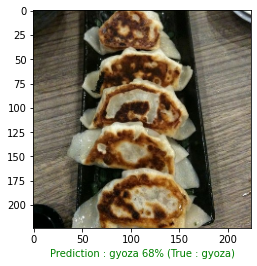

In [188]:
plot_random_image(model = model_1, images = test_images, true_labels = test_labels, classes = test_data.class_names)

# finding most wrong predictions

In [201]:
# get allfile paths in image dataset
file_paths = []
for filepath in test_data.list_files("101_food_classes_10_percent/test/*/*.jpg", shuffle = False):
    file_paths.append(filepath.numpy())

In [213]:
class_name = []
for directories in os.listdir("101_food_classes_10_percent/test"):
    class_name.append(directories)

class_name

['apple_pie',
 'baby_back_ribs',
 'baklava',
 'beef_carpaccio',
 'beef_tartare',
 'beet_salad',
 'beignets',
 'bibimbap',
 'bread_pudding',
 'breakfast_burrito',
 'bruschetta',
 'caesar_salad',
 'cannoli',
 'caprese_salad',
 'carrot_cake',
 'ceviche',
 'cheesecake',
 'cheese_plate',
 'chicken_curry',
 'chicken_quesadilla',
 'chicken_wings',
 'chocolate_cake',
 'chocolate_mousse',
 'churros',
 'clam_chowder',
 'club_sandwich',
 'crab_cakes',
 'creme_brulee',
 'croque_madame',
 'cup_cakes',
 'deviled_eggs',
 'donuts',
 'dumplings',
 'edamame',
 'eggs_benedict',
 'escargots',
 'falafel',
 'filet_mignon',
 'fish_and_chips',
 'foie_gras',
 'french_fries',
 'french_onion_soup',
 'french_toast',
 'fried_calamari',
 'fried_rice',
 'frozen_yogurt',
 'garlic_bread',
 'gnocchi',
 'greek_salad',
 'grilled_cheese_sandwich',
 'grilled_salmon',
 'guacamole',
 'gyoza',
 'hamburger',
 'hot_and_sour_soup',
 'hot_dog',
 'huevos_rancheros',
 'hummus',
 'ice_cream',
 'lasagna',
 'lobster_bisque',
 'lobster

In [225]:
def load_and_prep_image(image, img_size = 224, scale = True):
    """
    read an image from filw_name and turn it into tensor and 
    reshape it to thr size (img_size, img_size, color channel)
    """
    
    # rwad the image
    img = tf.io.read_file(image)
    
    # decode the image
    img = tf.image.decode_image(img)
    
    # resize the image
    img = tf.image.resize(img, size = (img_size, img_size))
    
    # scale
    if scale:
        return img/255.
    else:
        return img

In [220]:
# create dataframe dataframe of each parameter for test images
pred_df = pd.DataFrame({"img_path": file_paths,
                       "y_true": test_labels,
                       "y_pred": pred_classes,
                       "pred_conf": pred_probs.max(axis = 1),
                       "y_true_classname": [class_name[i] for i in test_labels],
                       "y_pred_classname": [class_name[i] for i in pred_classes]})

pred_df[:20]

,img_path,y_true,y_pred,pred_conf,y_true_classname,y_pred_classname
0,b'101_food_classes_10_percent\\test\\apple_pie...,0,0,0.368726,apple_pie,apple_pie
1,b'101_food_classes_10_percent\\test\\apple_pie...,0,0,0.916879,apple_pie,apple_pie
2,b'101_food_classes_10_percent\\test\\apple_pie...,0,0,0.352732,apple_pie,apple_pie
3,b'101_food_classes_10_percent\\test\\apple_pie...,0,8,0.161103,apple_pie,bread_pudding
4,b'101_food_classes_10_percent\\test\\apple_pie...,0,0,0.239451,apple_pie,apple_pie
5,b'101_food_classes_10_percent\\test\\apple_pie...,0,78,0.987756,apple_pie,poutine
6,b'101_food_classes_10_percent\\test\\apple_pie...,0,29,0.886467,apple_pie,cup_cakes
7,b'101_food_classes_10_percent\\test\\apple_pie...,0,0,0.475481,apple_pie,apple_pie
8,b'101_food_classes_10_percent\\test\\apple_pie...,0,9,0.368457,apple_pie,breakfast_burrito
9,b'101_food_classes_10_percent\\test\\apple_pie...,0,0,0.635657,apple_pie,apple_pie


In [221]:
# find which prediction is most wrong
pred_df["pred_correct"] = pred_df["y_true_classname"] == pred_df["y_pred_classname"]

pred_df[:20]

,img_path,y_true,y_pred,pred_conf,y_true_classname,y_pred_classname,pred_correct
0,b'101_food_classes_10_percent\\test\\apple_pie...,0,0,0.368726,apple_pie,apple_pie,True
1,b'101_food_classes_10_percent\\test\\apple_pie...,0,0,0.916879,apple_pie,apple_pie,True
2,b'101_food_classes_10_percent\\test\\apple_pie...,0,0,0.352732,apple_pie,apple_pie,True
3,b'101_food_classes_10_percent\\test\\apple_pie...,0,8,0.161103,apple_pie,bread_pudding,False
4,b'101_food_classes_10_percent\\test\\apple_pie...,0,0,0.239451,apple_pie,apple_pie,True
5,b'101_food_classes_10_percent\\test\\apple_pie...,0,78,0.987756,apple_pie,poutine,False
6,b'101_food_classes_10_percent\\test\\apple_pie...,0,29,0.886467,apple_pie,cup_cakes,False
7,b'101_food_classes_10_percent\\test\\apple_pie...,0,0,0.475481,apple_pie,apple_pie,True
8,b'101_food_classes_10_percent\\test\\apple_pie...,0,9,0.368457,apple_pie,breakfast_burrito,False
9,b'101_food_classes_10_percent\\test\\apple_pie...,0,0,0.635657,apple_pie,apple_pie,True


In [224]:
# sort datadrame for most wrong prediction on top
top_100_wrong = pred_df[pred_df["pred_correct"] == False].sort_values("pred_conf", ascending = False)

top_100_wrong[:20]

,img_path,y_true,y_pred,pred_conf,y_true_classname,y_pred_classname,pred_correct
23631,b'101_food_classes_10_percent\\test\\strawberr...,94,83,0.998732,strawberry_shortcake,red_velvet_cake,False
15826,b'101_food_classes_10_percent\\test\\macarons\...,63,29,0.998088,macarons,cup_cakes,False
23797,b'101_food_classes_10_percent\\test\\sushi\\16...,95,86,0.997463,sushi,sashimi,False
22203,b'101_food_classes_10_percent\\test\\seaweed_s...,88,51,0.996493,seaweed_salad,guacamole,False
11642,b'101_food_classes_10_percent\\test\\garlic_br...,46,10,0.996002,garlic_bread,bruschetta,False
22,b'101_food_classes_10_percent\\test\\apple_pie...,0,100,0.995848,apple_pie,waffles,False
18001,b'101_food_classes_10_percent\\test\\pancakes\...,72,67,0.995649,pancakes,omelette,False
21216,b'101_food_classes_10_percent\\test\\risotto\\...,84,70,0.994713,risotto,pad_thai,False
21810,b'101_food_classes_10_percent\\test\\scallops\...,87,29,0.994095,scallops,cup_cakes,False
11041,b'101_food_classes_10_percent\\test\\fried_ric...,44,51,0.993880,fried_rice,guacamole,False


# visulise the test data having wrong predictions but high probability

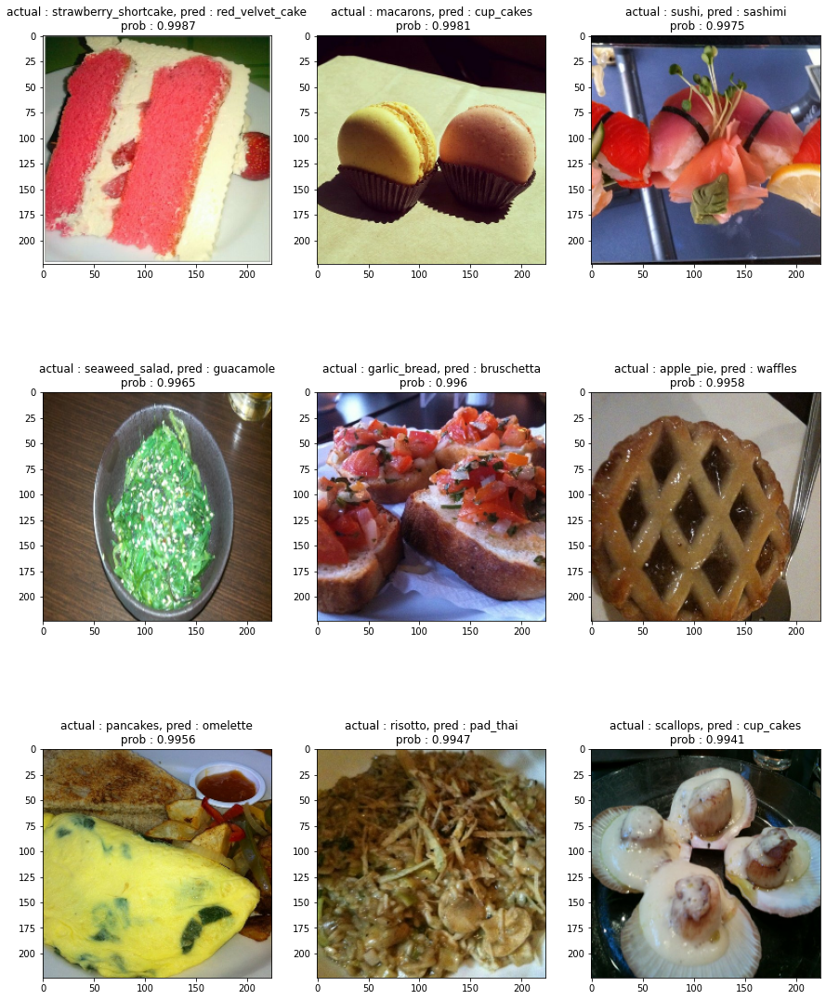

In [246]:
images_to_view = 9
start_index = 0
plt.figure(figsize = (15,20))
for i, row in enumerate(top_100_wrong[start_index : start_index + images_to_view].itertuples()):
    plt.subplot(3,3,i+1)
    img = load_and_prep_image(row[1], scale = False)
    _,_,_,_, pred_conf, y_true_classname, y_pred_classname,_ = row
    plt.imshow(img/255)
    plt.title(f"actual : {y_true_classname}, pred : {y_pred_classname}\n prob : {round(pred_conf, 4)}" )
    plt.axis = False

# test model on custem images

In [248]:
# get some food images
!wget https://storage.googleapis.com/ztm_tf_course/food_vision/custom_food_images.zip

import zipfile
zip_ref = zipfile.ZipFile("custom_food_images.zip")
zip_ref.extractall()
zip_ref.close()

--2022-01-19 23:47:27--  https://storage.googleapis.com/ztm_tf_course/food_vision/custom_food_images.zip
Resolving storage.googleapis.com (storage.googleapis.com)... 142.250.199.144, 142.250.66.16, 142.250.183.208, ...
Connecting to storage.googleapis.com (storage.googleapis.com)|142.250.199.144|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 13192985 (13M) [application/zip]
Saving to: 'custom_food_images.zip.1'

     0K .......... .......... .......... .......... ..........  0%  749K 17s
    50K .......... .......... .......... .......... ..........  0%  260K 33s
   100K .......... .......... .......... .......... ..........  1% 25.2M 22s
   150K .......... .......... .......... .......... ..........  1% 40.7M 17s
   200K .......... .......... .......... .......... ..........  1%  397K 20s
   250K .......... .......... .......... .......... ..........  2% 25.6M 16s
   300K .......... .......... .......... .......... ..........  2% 39.4M 14s
   350K ..........

In [250]:
custom_food_images = ["custom_food_images" + "/" +img_path for img_path in os.listdir("custom_food_images")]
custom_food_images

['custom_food_images/chicken_wings.jpeg',
 'custom_food_images/hamburger.jpeg',
 'custom_food_images/pizza-dad.jpeg',
 'custom_food_images/ramen.jpeg',
 'custom_food_images/steak.jpeg',
 'custom_food_images/sushi.jpeg']

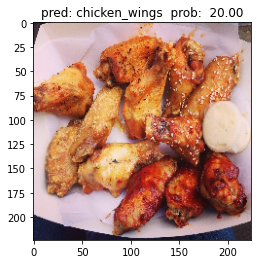

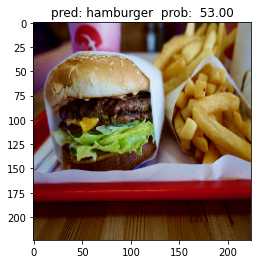

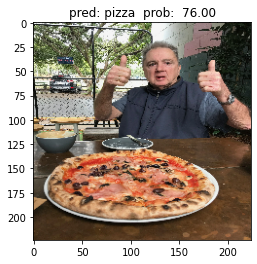

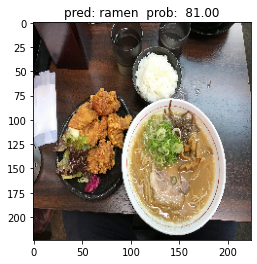

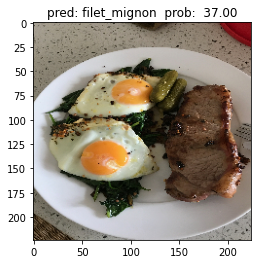

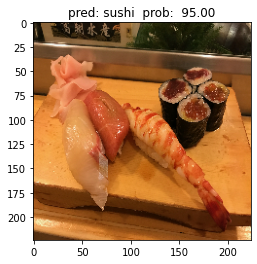

In [254]:
# make predictions on custon images
for img in custom_food_images:
    img = load_and_prep_image(img, scale = False)
    pred_probs_c = model_1.predict(tf.expand_dims(img, axis = 0))
    pred_class_c = class_name[pred_probs_c.argmax()]
    plt.figure()
    plt.imshow(img/255.)
    plt.title(f"pred: {pred_class_c}  prob: {pred_probs_c.argmax(): .2f}")
    plt.axis = False